In [1]:
import os
import json
import subprocess
import traceback

import pandas as pd
import numpy as np
from statsmodels.graphics.tsaplots import plot_acf
import statistics

import mne
import scipy
import json

import pandas as pd
import numpy as np

from scipy import stats
from scipy import signal
import matplotlib.pyplot as plt
from os import walk
from collections import Counter

In [2]:
def extract_strict_sectors(edf, sector_length = 600):
	"""
	Extract sectors of the given length using labels.
	Sample usage is extracting sectors of length 600 ms (1000Hz).

	Returns segments[begin,end] and labels

		** 1n восприятие / n проговаривание
	"""
	sectors = []
	labels = []

	number_of_current_phoneme = None
	counter = 0
	silent_speach = False
	
	METKA = edf['METKA']
	X = METKA[1]
	Y = METKA[0].T[:,0]
  
	for index, (timestamp, value) in enumerate(zip(X, Y)):
		counter-=1 
		if value > 0:
			value = int(value)
			
			# segment begin of silent speach 
			if value // 10 == 0:  
				counter = sector_length
				number_of_current_phoneme = value % 10
				silent_speach = True
			else:
				silent_speach = False # another label 
        
		if silent_speach and counter == 0: 
			sectors.append((index - sector_length, index))
			labels.append(number_of_current_phoneme)
	
	return sectors, labels

Загрузка данных

In [3]:
myography_prosebaya_path = '../../data/eeg_mio/converted/Prosebaya'
myography_vsluh_path = '../../data/eeg_mio/converted/Vsluh'

myography_prosebaya_filenames = sorted(next(walk(myography_prosebaya_path), (None, None, []))[2])
myography_vsluh_filenames = sorted(next(walk(myography_vsluh_path), (None, None, []))[2])

edf_prosebaya = []
for filename in myography_prosebaya_filenames:
    file_with_path = f'{myography_prosebaya_path}/{filename}'
    edf = mne.io.read_raw_edf(file_with_path)
    edf_prosebaya.append(edf)

edf_vsluh = []    
for filename in myography_vsluh_filenames:
    file_with_path = f'{myography_vsluh_path}/{filename}'
    edf = mne.io.read_raw_edf(file_with_path)
    edf_vsluh.append(edf)

Extracting EDF parameters from /home/admsys/Projects/data/eeg_mio/converted/Prosebaya/AbrosimovaF_ProsebyaChist.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /home/admsys/Projects/data/eeg_mio/converted/Prosebaya/AlyaksinaF_ProsebyaChist.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /home/admsys/Projects/data/eeg_mio/converted/Prosebaya/MorozovaF_ProsebyaChist.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /home/admsys/Projects/data/eeg_mio/converted/Prosebaya/NoginaF_ProsebyaChist.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /home/admsys/Projects/data/eeg_mio/converted/Prosebaya/RadionF_ProsebyaChist.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
E

In [4]:
def get_channel_edf(edf, name_channel):
    channel = edf[name_channel]
    Y_channel = list(channel[0][0])
    X_channel = channel[1]
    return X_channel, Y_channel
    
def plot_channel_edf(edf, name_channel):
    fig, ax = plt.subplots()
    Y_channel = get_channel_edf(edf, name_channel)[1]
    ax.plot(Y_channel)
    ax.set_title(f'Chanel {name_channel}', weight='bold', fontsize = 15)
    fig.set_figwidth(20)

Сегменты с мысленным проговариванием

ЭМГ:
 - Oz - на гортани
 - Fzp - над губой

In [6]:
phoneme_name = ["А – [а]", "Б – [б]", "Ф – [ф]", "Г – [г]", "М – [м]", "Р – [р]", "У – [у]"]

for efd_person in edf_vsluh:
    sectors, labels = extract_strict_sectors(efd_person)
    print(f"----- Испытуемый {efd_person} -----")

    phonemes_sectors = [[],[],[],[],[],[],[]]

    for i, (sector, label) in enumerate(zip(sectors, labels)):
        phonemes_sectors[label-1].append(sector)
    
    print(f"Кол-во фонем:")
    for i, phoneme_sector in enumerate(phonemes_sectors):
        print(f"{phoneme_name[i]} - {len(phoneme_sector)} ") 

----- Испытуемый <RawEDF | AbrosimovaF_VsluhChist.edf, 22 x 587873 (584.3 s), ~26 kB, data not loaded> -----
Кол-во фонем:
А – [а] - 24 
Б – [б] - 22 
Ф – [ф] - 22 
Г – [г] - 25 
М – [м] - 20 
Р – [р] - 22 
У – [у] - 19 
----- Испытуемый <RawEDF | AlyaksinaF_VsluhChist.edf, 22 x 591241 (587.7 s), ~26 kB, data not loaded> -----
Кол-во фонем:
А – [а] - 27 
Б – [б] - 23 
Ф – [ф] - 22 
Г – [г] - 25 
М – [м] - 23 
Р – [р] - 24 
У – [у] - 25 
----- Испытуемый <RawEDF | MorozovaF_VsluhChist.edf, 22 x 595224 (591.7 s), ~26 kB, data not loaded> -----
Кол-во фонем:
А – [а] - 27 
Б – [б] - 24 
Ф – [ф] - 26 
Г – [г] - 27 
М – [м] - 23 
Р – [р] - 27 
У – [у] - 26 
----- Испытуемый <RawEDF | NoginaF_VsluhChist.edf, 22 x 585948 (582.4 s), ~26 kB, data not loaded> -----
Кол-во фонем:
А – [а] - 24 
Б – [б] - 30 
Ф – [ф] - 27 
Г – [г] - 28 
М – [м] - 28 
Р – [р] - 24 
У – [у] - 28 
----- Испытуемый <RawEDF | RadionF_VsluhChist.edf, 22 x 585215 (581.7 s), ~26 kB, data not loaded> -----
Кол-во фонем:
А – 

Вывод сегментов с мысленным проговариванием (каналы ЭМГ)

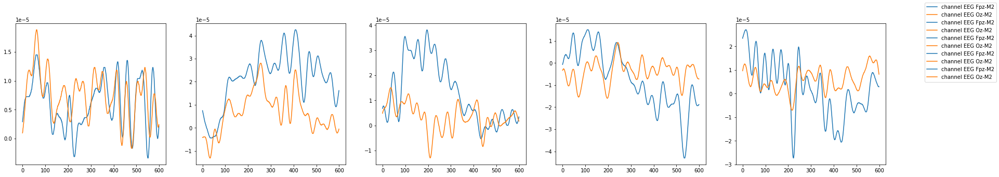

In [641]:
# выведем все каналы в секторе для одного человека в иследовании Просебя
efd_person = edf_prosebaya[3]
sectors, labels = extract_strict_sectors(efd_person)
sectors_channels = ['EEG Fpz-M2','EEG Oz-M2']

fig, ax = plt.subplots(figsize=(30, 5), nrows=1, ncols=5)
for i, sector in enumerate(sectors[10:15]):
    a, b  = sector
    for channel in sectors_channels:
        sectors_channel = get_channel_edf(efd_person,channel)[1][a:b]
        ax[i].plot(sectors_channel ,   label = f'channel {channel}')
fig.legend()

### Все сегменты по фонемам для каждого испытуемого 

*сегмент = 2 канала ЭМГ = 2-ве кривые 

- Oz (на гортани) - рыжий 
- Fpz (над губой) - голубой

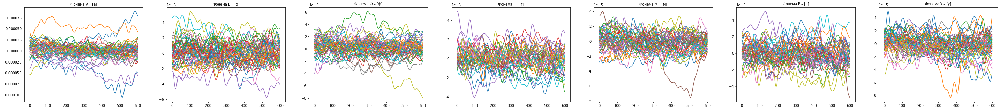

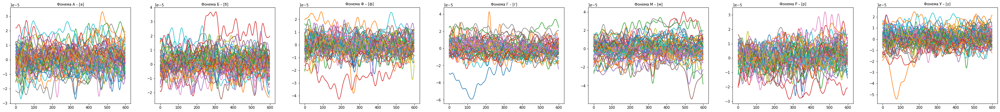

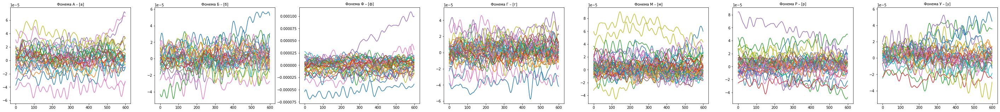

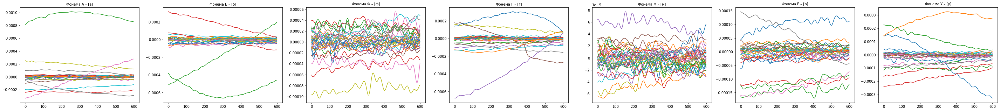

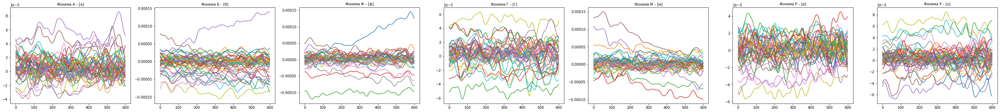

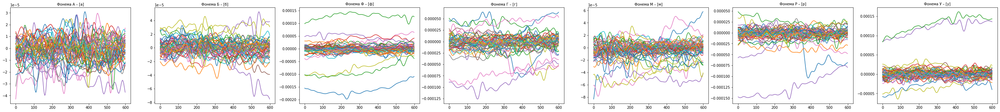

In [255]:
phoneme_name = ["А – [а]", "Б – [б]", "Ф – [ф]", "Г – [г]", "М – [м]", "Р – [р]", "У – [у]"]

for efd_person in edf_prosebaya:
    sectors, labels = extract_strict_sectors(efd_person)

    phonemes_sectors = [[],[],[],[],[],[],[]]
    
    # распределяем данные по фоненам
    for i, (sector, label) in enumerate(zip(sectors, labels)):
        phonemes_sectors[label-1].append(sector)
    
    fig, ax = plt.subplots(figsize=(50, 5), nrows=1, ncols=7)
    for i, phoneme_sector in enumerate(phonemes_sectors):
        for sector in phoneme_sector:
            a, b  = sector
            for channel in sectors_channels:
                sectors_channel = get_channel_edf(efd_person,channel)[1][a:b]
                ax[i].plot(sectors_channel)
                ax[i].set_title(f'Фонема {phoneme_name[i]}', fontsize=10)
    plt.show()

### Усреднение по всем сегментам по фонемам для каждого испытуемого 

*сегмент = 2 канала ЭМГ = 2-ве кривые 
- Oz (на гортани) - рыжий 
- Fpz (над губой) - голубой


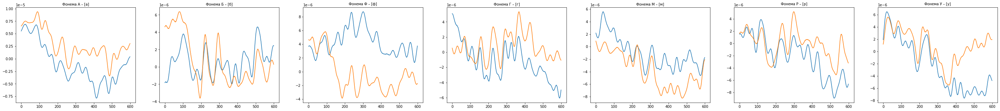

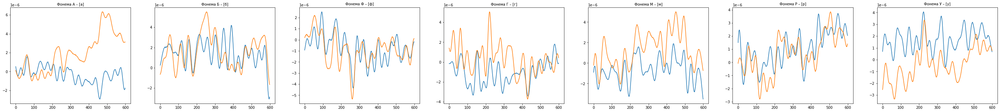

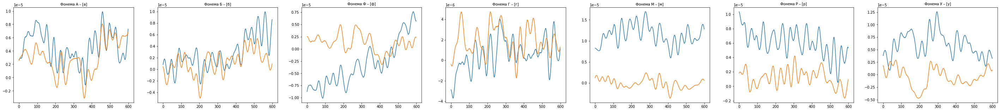

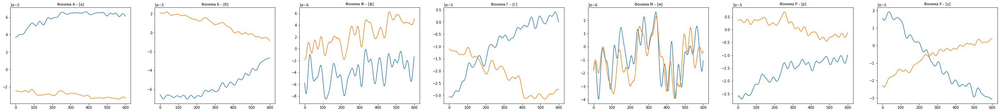

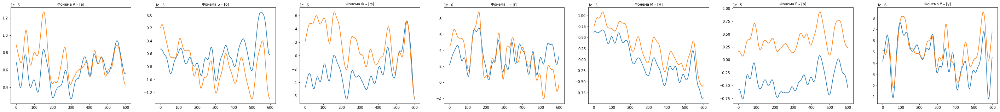

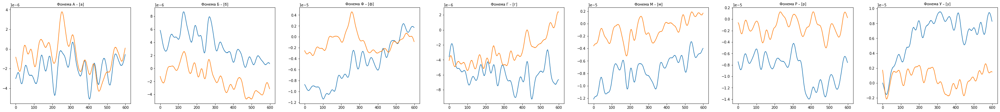

In [8]:
phoneme_name = ["А – [а]", "Б – [б]", "Ф – [ф]", "Г – [г]", "М – [м]", "Р – [р]", "У – [у]"]

for efd_person in edf_vsluh:
    sectors, labels = extract_strict_sectors(efd_person)
    
    phonemes_sectors = [[],[],[],[],[],[],[]]

    for i, (sector, label) in enumerate(zip(sectors, labels)):
        phonemes_sectors[label-1].append(sector)
        
    fig, ax = plt.subplots(figsize=(50, 5), nrows=1, ncols=7)

    for i, phoneme_sector in enumerate(phonemes_sectors):

        sum_sectors_channel0 = np.array(get_channel_edf(efd_person,sectors_channels[0])[1][phoneme_sector[0][0]:phoneme_sector[0][1]])
        sum_sectors_channel1 = np.array(get_channel_edf(efd_person,sectors_channels[1])[1][phoneme_sector[0][0]:phoneme_sector[0][1]])

        for sector in phoneme_sector:
            a, b  = sector

            sum_sectors_channel0 += np.array(get_channel_edf(efd_person,sectors_channels[0])[1][a:b])
            sum_sectors_channel1 += np.array(get_channel_edf(efd_person,sectors_channels[1])[1][a:b])
        
        avrg_sectors_channel0 = np.array(sum_sectors_channel0) / ( len(phoneme_sector) + 1 )
        avrg_sectors_channel1 = np.array(sum_sectors_channel1) / ( len(phoneme_sector) + 1 )

        ax[i].plot(avrg_sectors_channel0)
        ax[i].plot(avrg_sectors_channel1)
        ax[i].set_title(f'Фонема {phoneme_name[i]}', fontsize=10)
    plt.show()

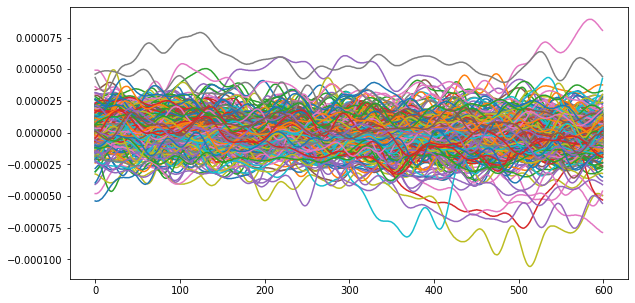

In [256]:
# все сегменты для всех фонем одного испытуемого
sectors_channels = ['EEG Fpz-M2','EEG Oz-M2']

efd_person = edf_prosebaya[0]

fig, ax = plt.subplots(figsize=(10, 5))
sectors, _ = extract_strict_sectors(efd_person)
    
for sector in sectors:
    a, b  = sector
    for channel in sectors_channels:
        sectors_channel = get_channel_edf(efd_person,channel)[1][a:b]
        ax.plot(sectors_channel)
plt.show()

### Нормировка сегментов 

In [326]:
def norm_segment(segment):
    return segment - np.mean(segment)

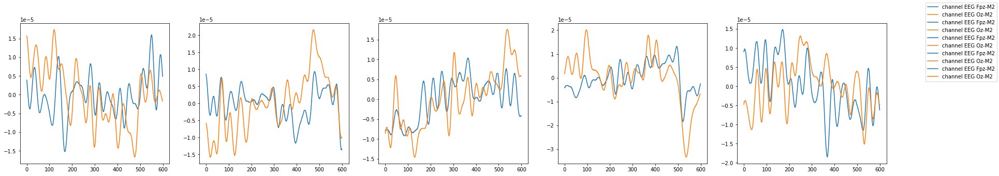

In [490]:
# выведем все каналы в секторе для одного человека в иследовании Просебя
efd_person = edf_prosebaya[1]
sectors, labels = extract_strict_sectors(efd_person)
sectors_channels = ['EEG Fpz-M2','EEG Oz-M2']

fig, ax = plt.subplots(figsize=(30, 5), nrows=1, ncols=5)
for i, sector in enumerate(sectors[10:15]):
    a, b  = sector
    for channel in sectors_channels:
        sectors_channel = norm_segment(get_channel_edf(efd_person,channel)[1][a:b])
        ax[i].plot(sectors_channel ,   label = f'channel {channel}')
fig.legend()

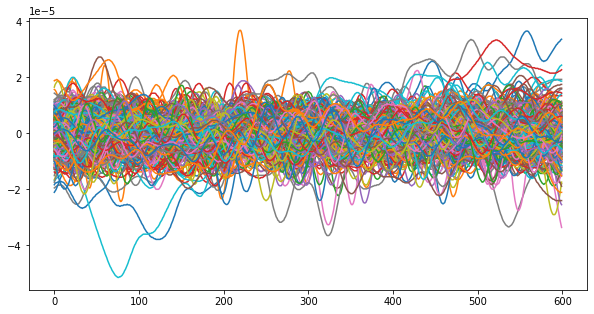

In [461]:
# все сегменты для всех фонем одного испытуемого
sectors_channels = ['EEG Fpz-M2','EEG Oz-M2']

efd_person = edf_prosebaya[1]

fig, ax = plt.subplots(figsize=(10, 5))
sectors, _ = extract_strict_sectors(efd_person)
    
for sector in sectors:
    a, b  = sector
    for channel in sectors_channels:
        sectors_channel = norm_segment(get_channel_edf(efd_person,channel)[1][a:b])
        ax.plot(sectors_channel)
plt.show()

### Усреднение по всем нормированным сегментам по фонемам для каждого испытуемого

*сегмент = 2 канала ЭМГ = 2-ве кривые
Oz (на гортани) - рыжий
Fpz (над губой) - голубой

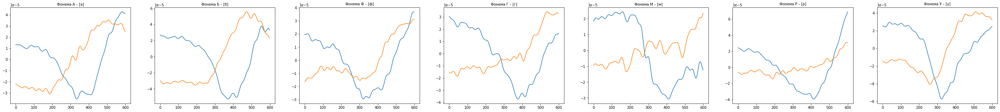

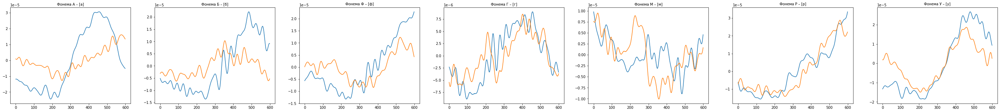

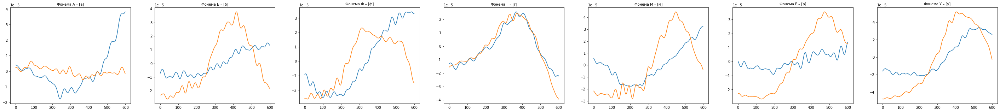

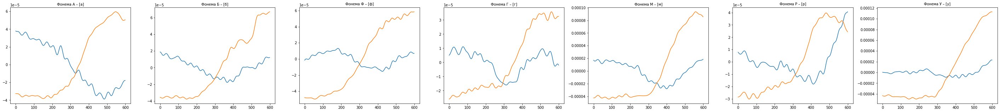

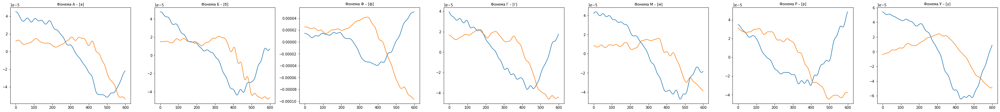

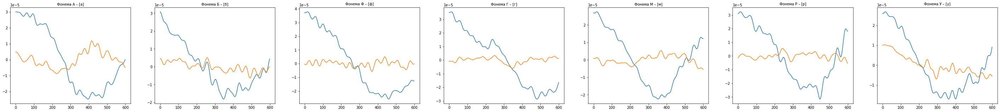

In [639]:
phoneme_name = ["А – [а]", "Б – [б]", "Ф – [ф]", "Г – [г]", "М – [м]", "Р – [р]", "У – [у]"]

for efd_person in edf_vsluh:
    sectors, labels = extract_strict_sectors(efd_person)
    
    phonemes_sectors = [[],[],[],[],[],[],[]]

    for i, (sector, label) in enumerate(zip(sectors, labels)):
        phonemes_sectors[label-1].append(sector)
        
    fig, ax = plt.subplots(figsize=(50, 5), nrows=1, ncols=7)

    for i, phoneme_sector in enumerate(phonemes_sectors):

        sum_sectors_channel0 = np.array(norm_segment(get_channel_edf(efd_person,sectors_channels[0])[1][phoneme_sector[0][0]:phoneme_sector[0][1]]))
        sum_sectors_channel1 = np.array(norm_segment(get_channel_edf(efd_person,sectors_channels[1])[1][phoneme_sector[0][0]:phoneme_sector[0][1]]))

        for sector in phoneme_sector:
            a, b  = sector

            sum_sectors_channel0 += np.array(norm_segment(get_channel_edf(efd_person,sectors_channels[0])[1][a:b]))
            sum_sectors_channel1 += np.array(norm_segment(get_channel_edf(efd_person,sectors_channels[1])[1][a:b]))
        
        avrg_sectors_channel0 = np.array(sum_sectors_channel0) / ( len(phoneme_sector) + 1 )
        avrg_sectors_channel1 = np.array(sum_sectors_channel1) / ( len(phoneme_sector) + 1 )

        ax[i].plot(avrg_sectors_channel0)
        ax[i].plot(avrg_sectors_channel1)
        ax[i].set_title(f'Фонема {phoneme_name[i]}', fontsize=10)
    plt.show()

In [640]:
def add_noise(channel):
    noise = np.random.normal(0, 0.000003, 500)
    return [i + j for i, j in zip(channel, noise)]

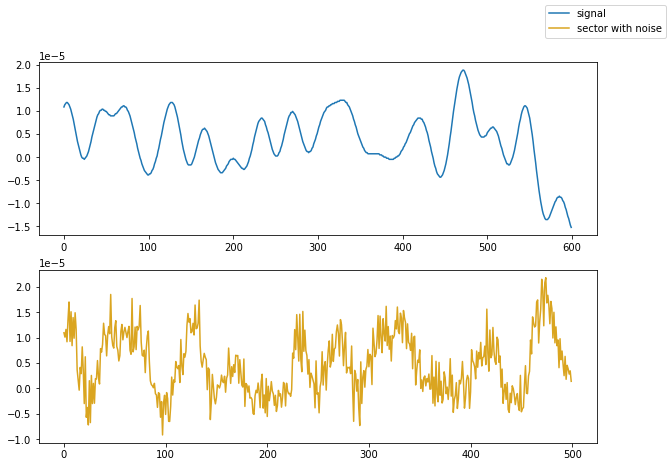

In [638]:
fig, ax = plt.subplots(figsize=(10, 7), nrows=2, ncols=1)

efd_person = edf_prosebaya[3]
sector = sectors[13]
a, b  = sector

sector = get_channel_edf(efd_person, 'EEG Fpz-M2')[1][a:b]
ax[0].plot(sector,  label = f'signal' )

sector_with_noise = add_noise(sector)

ax[1].plot(sector_with_noise, color =  "goldenrod",   label = f'sector with noise')

fig.legend()

# _______________________________________________________________________________________________________________

# Нахождение начальной точки

In [9]:
efd_person = edf_prosebaya[3]
sectors_channels = ['EEG Fpz-M2','EEG Oz-M2']

In [10]:
def show_method(method, windows_size = 100, num_sector = 13, sectors_channel = 1): 
    fig, ax = plt.subplots(figsize=(10, 7), nrows=2, ncols=1)

    sector_channel = ['EEG Fpz-M2','EEG Oz-M2'][sectors_channel]

    sector = sectors[num_sector]
    a, b  = sector

    sector = get_channel_edf(efd_person, sector_channel)[1][a:b]
    ax[0].plot(sector,  label = f'signal {sector_channel}' )
    y = method(sector, windows_size )
    
    ax[1].plot(y, color =  "goldenrod",   label = f'{method.__name__}')

    fig.legend()

# Энергия короткого времени 

Энергия E(n) -  определяется как сумма величин 10 мс речи, центрированных на интервале измерения

In [520]:
def get_short_time_energy(timeserie, size_frame = 100):
    timeserie = [*([0]*size_frame), *timeserie]# дополняем нулями 
    return [sum((np.array(timeserie[i_start_frame:i_start_frame + size_frame])**2)/2*size_frame) for i_start_frame  in range(len(timeserie)-size_frame)]

### Со статическим окном

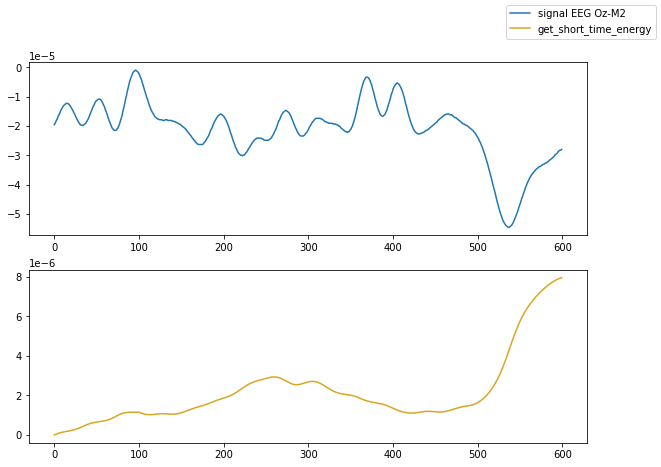

In [521]:
show_method(get_short_time_energy, num_sector = 13)

### С динамическим окном Хемминга 

In [642]:
def get_short_time_energy_Hemming_window(timeserie, windows_size = None):
    N = len(timeserie)
    
    res = []
    for i_start_frame  in range(len(timeserie)):
        window = 0.54-0.46*np.cos((2*np.pi*i_start_frame)/(N-1))
        window = int(round(window,3)*100) 

        res.append(sum(np.array(timeserie[i_start_frame:i_start_frame + window ])**2/2*N))

    return res

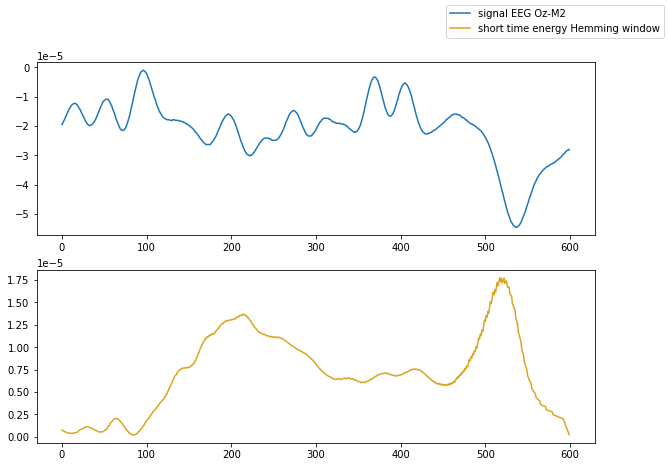

In [568]:
fig, ax = plt.subplots(figsize=(10, 7), nrows=2, ncols=1)  
sector = sectors[13]
a, b  = sector

sector = get_channel_edf(efd_person, 'EEG Oz-M2')[1][a:b]
ax[0].plot(sector,  label = f'signal EEG Oz-M2' )
y = get_short_time_energy_Hemming_window(sector)
    
ax[1].plot(y, color =  "goldenrod",   label = f'short time energy Hemming window')
fig.legend()

### Подбор параметров для алгоритма кратковременной энергии

In [ ]:
phoneme_name = ["А – [а]", "Б – [б]", "Ф – [ф]", "Г – [г]", "М – [м]", "Р – [р]", "У – [у]"]
sectors_channels = ['EEG Fpz-M2','EEG Oz-M2']

def show_average_timeserie_with_norm(method, windows_size = 50, efd_person = edf_prosebay[1]):
    for efd_person in edf_prosebaya:
    sectors, labels = extract_strict_sectors(efd_person)

    phonemes_sectors = [[],[],[],[],[],[],[]]

    # распределяем данные по фоненам 
    for i, (sector, label) in enumerate(zip(sectors, labels)):
        phonemes_sectors[label-1].append(sector)

    fig, ax = plt.subplots(figsize=(50, 5), nrows=1, ncols=7)

    for i, phoneme_sector in enumerate(phonemes_sectors):

        sector0 = get_channel_edf(efd_person, sectors_channels[0])[1][phoneme_sector[0][0]:phoneme_sector[0][1]]
        sector1 = get_channel_edf(efd_person, sectors_channels[1])[1][phoneme_sector[0][0]:phoneme_sector[0][1]]

        sum_sectors_channel0 = np.array(method(sector0, windows_size))
        sum_sectors_channel1 = np.array(method(sector1, windows_size))

        for sector in phoneme_sector:
            a, b  = sector

            sector0 = get_channel_edf(efd_person, sectors_channels[0])[1][a:b]
            sector1 = get_channel_edf(efd_person, sectors_channels[1])[1][a:b]

            sum_sectors_channel0 += np.array(method(sector0, windows_size))
            sum_sectors_channel1 += np.array(method(sector1, windows_size))

        avrg_sectors_channel0 = np.array(sum_sectors_channel0) / ( len(phoneme_sector) + 1 )
        avrg_sectors_channel1 = np.array(sum_sectors_channel1) / ( len(phoneme_sector) + 1 )

        ax[i].plot(avrg_sectors_channel0)
        ax[i].plot(avrg_sectors_channel1)
        ax[i].set_title(f'Фонема {phoneme_name[i]}', fontsize=10)
    plt.show()

In [332]:
phoneme_name = ["А – [а]", "Б – [б]", "Ф – [ф]", "Г – [г]", "М – [м]", "Р – [р]", "У – [у]"]
sectors_channels = ['EEG Fpz-M2','EEG Oz-M2']

def show_average_timeserie(method, windows_size = 50 ):
    for efd_person in edf_prosebaya:
        sectors, labels = extract_strict_sectors(efd_person)

        phonemes_sectors = [[],[],[],[],[],[],[]]
        
        # распределяем данные по фоненам
        for i, (sector, label) in enumerate(zip(sectors, labels)):
            phonemes_sectors[label-1].append(sector)

        fig, ax = plt.subplots(figsize=(50, 5), nrows=1, ncols=7)

        for i, phoneme_sector in enumerate(phonemes_sectors):

            sector0 = get_channel_edf(efd_person, sectors_channels[0])[1][phoneme_sector[0][0]:phoneme_sector[0][1]]
            sector1 = get_channel_edf(efd_person, sectors_channels[1])[1][phoneme_sector[0][0]:phoneme_sector[0][1]]

            sum_sectors_channel0 = np.array(method(sector0, windows_size))
            sum_sectors_channel1 = np.array(method(sector1, windows_size))

            for sector in phoneme_sector:
                a, b  = sector

                sector0 = get_channel_edf(efd_person, sectors_channels[0])[1][a:b]
                sector1 = get_channel_edf(efd_person, sectors_channels[1])[1][a:b]

                sum_sectors_channel0 += np.array(method(sector0, windows_size))
                sum_sectors_channel1 += np.array(method(sector1, windows_size))

            avrg_sectors_channel0 = np.array(sum_sectors_channel0) / ( len(phoneme_sector) + 1 )
            avrg_sectors_channel1 = np.array(sum_sectors_channel1) / ( len(phoneme_sector) + 1 )

            ax[i].plot(avrg_sectors_channel0)
            ax[i].plot(avrg_sectors_channel1)
            ax[i].set_title(f'Фонема {phoneme_name[i]}', fontsize=10)
        plt.show()

# Усреднение по всем сегментам по фонемам для каждого испытуемого

*сегмент = 2 канала ЭМГ = 2-ве кривые

Oz (на гортани) - рыжий
Fpz (над губой) - голубой

### Кратковременная энергия со статическим окном = 50 

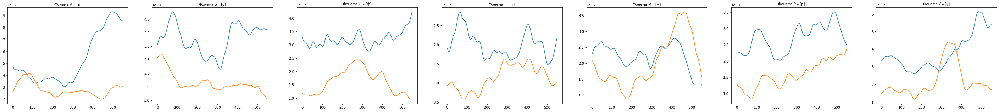

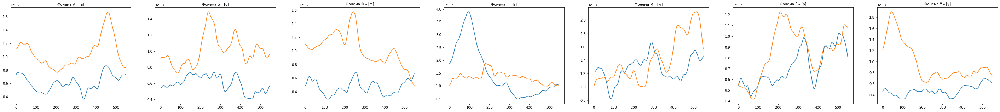

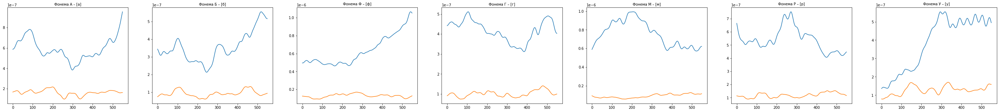

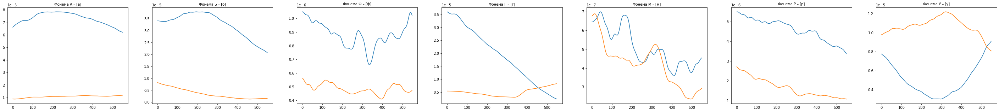

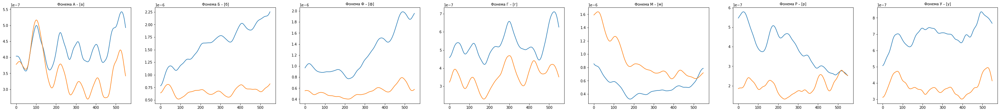

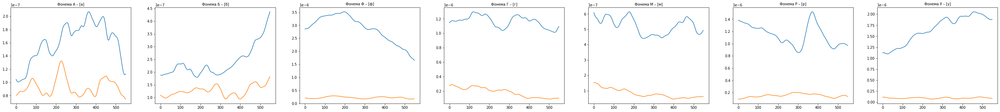

In [16]:
show_average_timeserie(get_short_time_energy,windows_size = 50)

### Кратковременная энергия со статическим окном = 100 

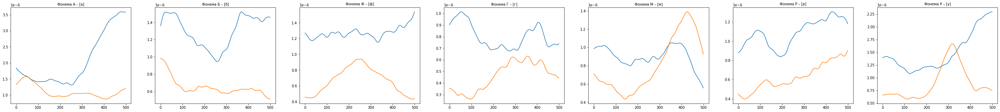

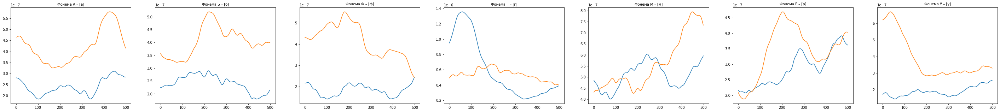

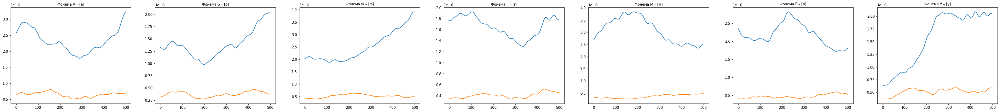

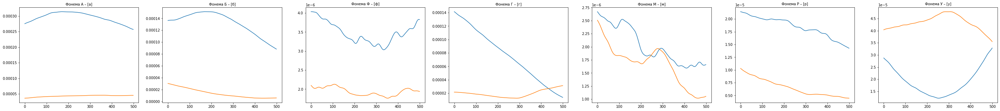

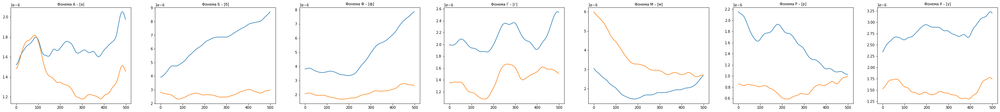

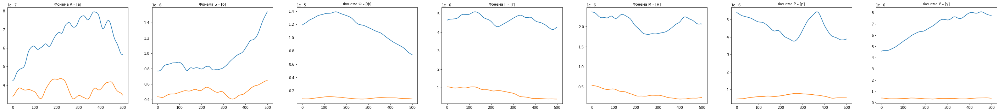

In [17]:
show_average_timeserie(get_short_time_energy,windows_size = 100)

### Кратковременная энергия со статическим окном = 150 

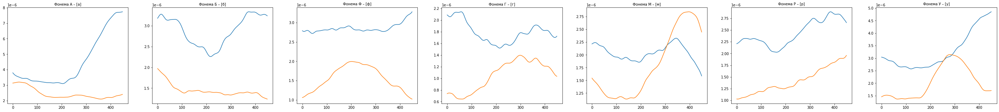

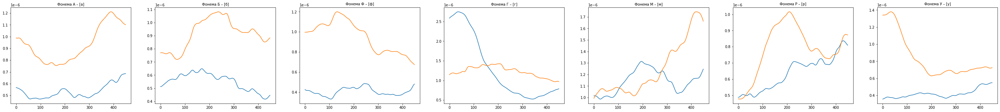

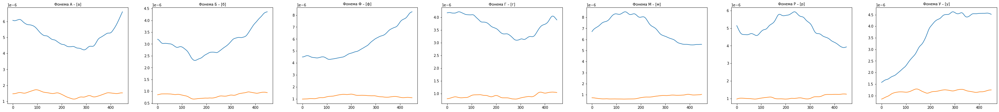

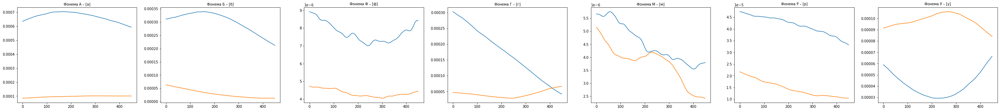

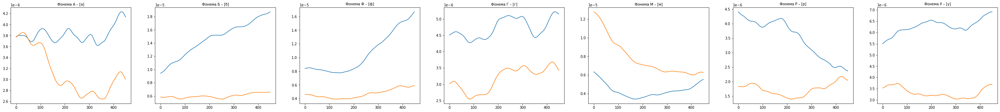

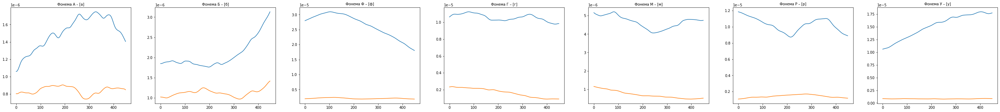

In [18]:
show_average_timeserie(get_short_time_energy, windows_size = 150)

### Кратковременная энергия с динамическим окном Хемминга

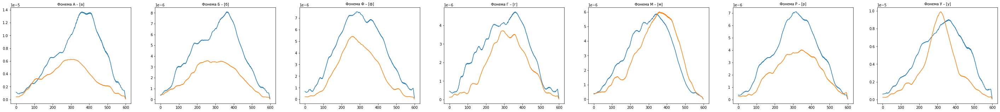

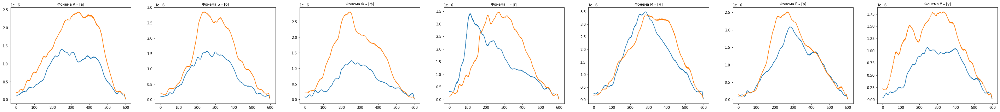

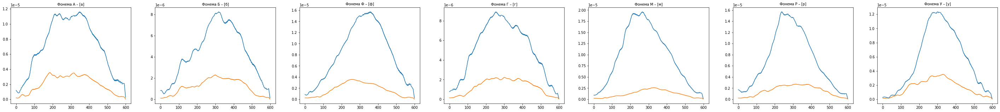

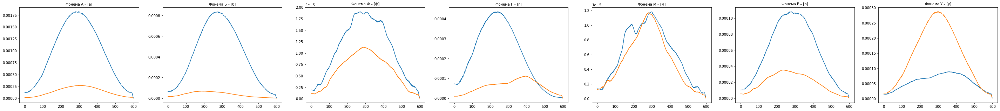

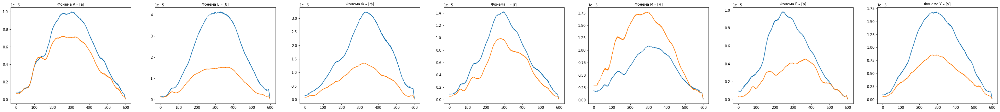

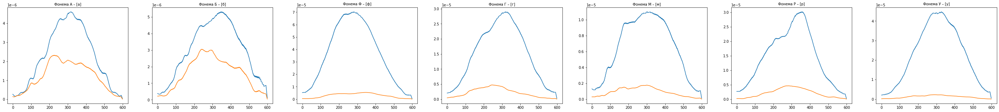

In [585]:
show_average_timeserie(get_short_time_energy_Hemming_window)

In [ ]:
phoneme_name = ["А – [а]", "Б – [б]", "Ф – [ф]", "Г – [г]", "М – [м]", "Р – [р]", "У – [у]"]
sectors_channels = ['EEG Fpz-M2','EEG Oz-M2']

windows_size = 50 

for efd_person in edf_prosebaya:
    sectors, labels = extract_strict_sectors(efd_person)
    
    phonemes_sectors = [[],[],[],[],[],[],[]]

    for i, (sector, label) in enumerate(zip(sectors, labels)):
        phonemes_sectors[label-1].append(sector)
        
    fig, ax = plt.subplots(figsize=(50, 5), nrows=1, ncols=7)

    for i, phoneme_sector in enumerate(phonemes_sectors):

        sector0 = get_channel_edf(efd_person, sectors_channels[0])[1][phoneme_sector[0][0]:phoneme_sector[0][1]]
        sector1 = get_channel_edf(efd_person, sectors_channels[1])[1][phoneme_sector[0][0]:phoneme_sector[0][1]]

        sum_sectors_channel0 = np.array(get_short_time_energy(sector0, windows_size))
        sum_sectors_channel1 = np.array(get_short_time_energy(sector1, windows_size))
        
        for sector in phoneme_sector:
            a, b  = sector
            
            sector0 = get_channel_edf(efd_person, sectors_channels[0])[1][a:b]
            sector1 = get_channel_edf(efd_person, sectors_channels[1])[1][a:b]

            sum_sectors_channel0 += np.array(get_short_time_energy(sector0, windows_size))
            sum_sectors_channel1 += np.array(get_short_time_energy(sector1, windows_size))
        
        avrg_sectors_channel0 = np.array(sum_sectors_channel0) / ( len(phoneme_sector) + 1 )
        avrg_sectors_channel1 = np.array(sum_sectors_channel1) / ( len(phoneme_sector) + 1 )

        ax[i].plot(avrg_sectors_channel0)
        ax[i].plot(avrg_sectors_channel1)
        ax[i].set_title(f'Фонема {phoneme_name[i]}', fontsize=10)
    plt.show()

In [571]:
def search_beginning(short_time_energy, limit_of_speech_absence = 100, r = 0.15, k = 4, m = 2.5 ):
    segment_without_speech = short_time_energy[:limit_of_speech_absence] 
    segment_with_speech = short_time_energy[limit_of_speech_absence:] 
    
    IMX = max(segment_with_speech)
    IMN = np.mean(segment_without_speech)
    
    # уровень, который составляет 3 процента от пиковой энергии (с поправкой на энергию тишины )
    I1 = r*(IMX - IMN) + IMN # исправила на 10%

    I2 = k*IMN
    
    # нижний порог
    ITL = min(I1, I2)
    
    # верхний порог
    ITU = m*ITL

    '''
    Алгоритм начинается с поиска с начала интервала до тех пор, пока не будет превышен нижний порог. 
    Эта точка предварительно помечается как начало высказывания, 
    если только энергия не опустится ниже НЕЕ до того, как поднимется выше ITU. 
    Ешли это происходит, новая начальная точка получается путем нахождения первой точки, 
    в которой энергия превышает ITL, а затем превышает ITU, прежде чем опуститься ниже ITL; 
    в конечном счете такая начальная точка должна существовать. 
      
    '''
    
    i_u = [time + limit_of_speech_absence for time, speech in enumerate(segment_with_speech)if speech >= ITU ]
    i_l = [time + limit_of_speech_absence for time, speech in enumerate(segment_with_speech) if speech <= ITL ]
    
    if len(i_l) == 0 or len(i_u) == 0:
        return 0, IMX,  IMN, ITL,  ITU
    
    I1 = [time for time in i_l if time <= i_u[0] ]

    if len(I1) == 0:
        return 0, IMX,  IMN, ITL,  ITU

    return I1[len(I1)-1], IMX,  IMN, ITL,  ITU


In [572]:
def show_searching_beginning_short_time_energy(efd_person = edf_prosebaya[0], sector = sectors[10], num_sectors_channels = 1 ):
    fig, ax = plt.subplots(figsize=(10, 3), nrows=1, ncols=2)
    
    # Fpz (над губой) - голубой Oz (на гортани) - рыжий 
    sectors_channel = ['EEG Fpz-M2','EEG Oz-M2'][num_sectors_channels]
    color = ['blue', 'orange'][num_sectors_channels]

    a, b  = sector

    sectors_channel = get_channel_edf(efd_person, sectors_channel)[1][a:b]
    ax[0].plot( sectors_channel,  label = f'signal', color = color)
    plt.xlabel('time')
    plt.ylabel(f'signal {sectors_channel}')
    
    
    short_time_energy = get_short_time_energy(sectors_channel, 100)
    N ,IMX, IMN, ITL,  ITU = search_beginning(short_time_energy, 100)

    ax[1].plot(short_time_energy,  label = f'short-time energy')
    ax[1].axvline( x = N , color ='purple', label = f'beginning point')

    ax[1].axhline( y = IMX , color ='red', label = f'IMX')
    ax[1].axhline( y = IMN , color ='gold', label = f'IMN')
    ax[1].axhline( y = ITL, color ='lightblue', label = f'ITL')
    ax[1].axhline( y = ITU , color ='thistle', label = f'ITU')

    plt.title('Алгоритм поиска начальной точки на основе кратковременной энергии')
    plt.xlabel('time')
    plt.ylabel('short-time energy')
    fig.legend()

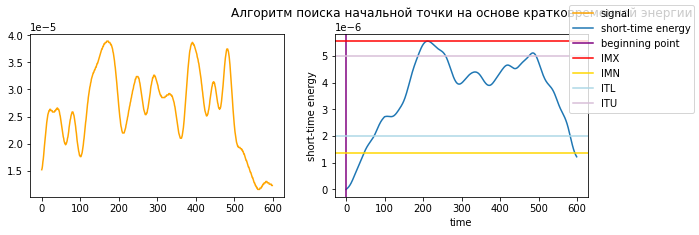

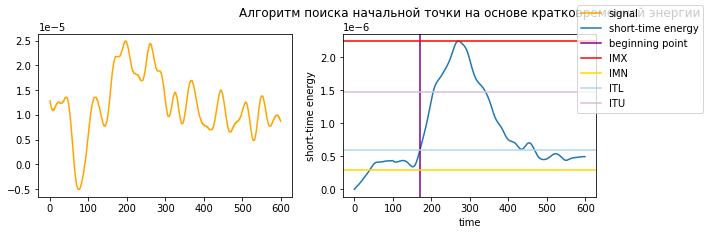

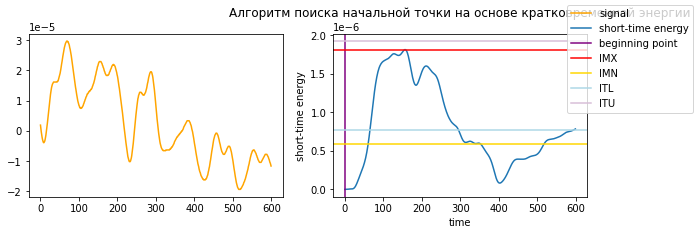

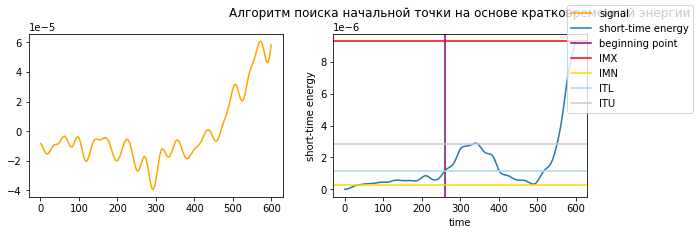

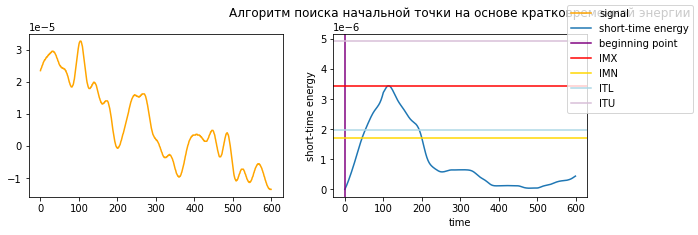

In [643]:
for i in range(10,50,10):
    show_searching_beginning_short_time_energy(sector = sectors[i])

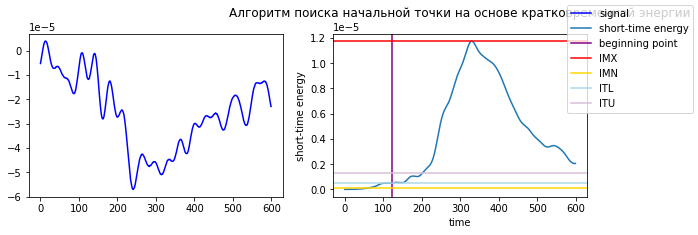

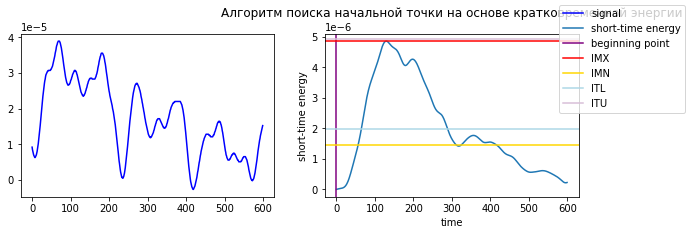

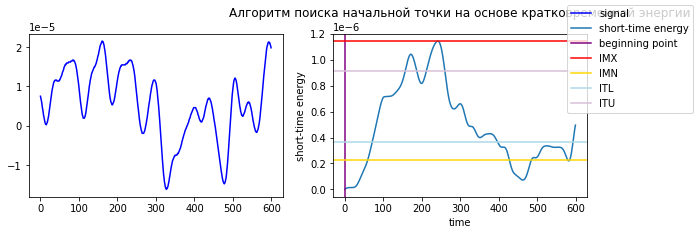

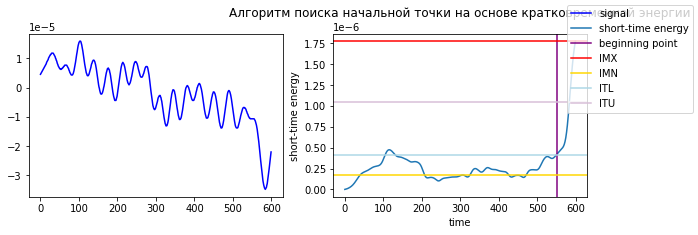

In [650]:
for i in range(10,90,50):
    show_searching_beginning_short_time_energy(sector = sectors[i],  num_sectors_channels = 0)
show_searching_beginning_short_time_energy(sector = sectors[30],  num_sectors_channels = 0)
show_searching_beginning_short_time_energy(sector = sectors[80],  num_sectors_channels = 0)

In [569]:
efd_person = edf_prosebaya[1]
sectors, labels = extract_strict_sectors(efd_person)
sectors_channels = ['EEG Fpz-M2','EEG Oz-M2']

windows_size = 100
    
res = []
for r in [0.15]:
    for m in [2.5, 3, 3.5, 4]:
        print(f' ---- r = {r}, m = {m}')

        begin_Fpz = []
        begin_Oz = []
        for i_sectors, sector in enumerate(sectors):
            a, b  = sector

            sector0 = norm_segment(get_channel_edf(efd_person, sectors_channels[0])[1][a:b])
            sector1 = norm_segment(get_channel_edf(efd_person, sectors_channels[1])[1][a:b])
            
            short_time_energy0 = get_short_time_energy(sector0, windows_size)
            short_time_energy1 = get_short_time_energy(sector1, windows_size)
            
            begin_Fpz.append(search_beginning(short_time_energy0, r = r, m = m)[0])
            begin_Oz.append(search_beginning(short_time_energy1, r = r, m = m)[0])
        
        no_zero_Fpz = [i for i in begin_Fpz if i != 0 ]
        no_zero_Oz = [i for i in begin_Oz if i != 0 ]
        
        print(f'Процент ненулевых начальных точек в канале Fpz : {round(len(no_zero_Fpz)*100/len(begin_Fpz))}%')
        print(f'Процент ненулевых начальных точек в канале Oz: {round(len(no_zero_Oz)*100/len(begin_Oz))}%')
        
        print(f'MEAN ненулевых начальных точек в канале Fpz : {round(np.mean(no_zero_Fpz))}')
        print(f'MEAN ненулевых начальных точек в канале Oz: {round(np.mean(no_zero_Oz))}')

 ---- r = 0.15, m = 2.5
Процент ненулевых начальных точек в канале Fpz : 48%
Процент ненулевых начальных точек в канале Oz: 37%
MEAN ненулевых начальных точек в канале Fpz : 281
MEAN ненулевых начальных точек в канале Oz: 288
 ---- r = 0.15, m = 3
Процент ненулевых начальных точек в канале Fpz : 42%
Процент ненулевых начальных точек в канале Oz: 32%
MEAN ненулевых начальных точек в канале Fpz : 282
MEAN ненулевых начальных точек в канале Oz: 297
 ---- r = 0.15, m = 3.5
Процент ненулевых начальных точек в канале Fpz : 32%
Процент ненулевых начальных точек в канале Oz: 25%
MEAN ненулевых начальных точек в канале Fpz : 283
MEAN ненулевых начальных точек в канале Oz: 292
 ---- r = 0.15, m = 4
Процент ненулевых начальных точек в канале Fpz : 24%
Процент ненулевых начальных точек в канале Oz: 19%
MEAN ненулевых начальных точек в канале Fpz : 274
MEAN ненулевых начальных точек в канале Oz: 287


In [570]:
# процент нулевых точек: 
zero_counter_Fpz = 0
zero_counter_Oz = 0
all_counter = 0 
for i_person, person in enumerate(edf_prosebaya_beginning_phonemes):
    for i_phoneme, beginning_phoneme in enumerate(person):
        print(len([i for i in beginning_phoneme[0] if i == 0 ]),len([i for i in beginning_phoneme[1] if i == 0 ]) )
        zero_counter_Fpz += len([i for i in beginning_phoneme[0] if i == 0 ])
        zero_counter_Oz += len([i for i in beginning_phoneme[1] if i == 0 ])
        all_counter += len(beginning_phoneme[0])
        
print(f'Процент нулевых начальных точек в канале Fpz : {round(zero_counter_Fpz*100/all_counter)}%')
print(f'Процент нулевых начальных точек в канале Oz: {round(zero_counter_Oz*100/all_counter)}%')

21 19
19 19
19 17
15 14
20 15
16 13
15 16
23 18
19 13
16 17
20 17
15 18
16 15
19 20
12 11
13 10
11 11
14 13
19 12
14 14
9 9
13 13
15 12
14 11
15 15
14 15
14 14
10 12
16 19
18 16
10 11
14 14
16 17
19 16
17 16
8 17
14 16
18 18
13 20
19 22
15 18
19 20
15 12
13 13
13 13
16 15
15 11
16 10
13 13
10 13
9 11
8 13
11 13
10 11
7 12
14 12
14 15
12 14
13 15
16 15
14 14
11 18
16 13
17 18
12 15
17 18
14 17
15 15
15 21
16 19
Процент нулевых начальных точек в канале Fpz : 64%
Процент нулевых начальных точек в канале Oz: 64%


In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))
efd_person = edf_prosebaya[3]
sector = sectors[13]
a, b  = sector

sectors_channel = get_channel_edf(efd_person,'EEG Oz-M2')[1][a:b]

short_time_energy = get_short_time_energy_Hemming_window(sectors_channel)
N ,IMX, IMN, ITL,  ITU = search_beginning(short_time_energy, 100)

ax.plot(short_time_energy,  label = f'short-time energy')
ax.axvline( x = N , color ='purple', label = f'beginning point')

ax.axhline( y = IMX , color ='red', label = f'IMX')
ax.axhline( y = IMN , color ='gold', label = f'IMN')
ax.axhline( y = ITL, color ='lightblue', label = f'ITL')
ax.axhline( y = ITU , color ='thistle', label = f'ITU')

plt.title('Алгоритм поиска начальной точки на основе кратковременной энергии')
plt.xlabel('time')
plt.ylabel('short-time energy')
fig.legend()

In [575]:
phoneme_name = ["А – [а]", "Б – [б]", "Ф – [ф]", "Г – [г]", "М – [м]", "Р – [р]", "У – [у]"]
sectors_channels = ['EEG Fpz-M2','EEG Oz-M2']

windows_size = 100 

edf_prosebaya_beginning_phonemes = []

for efd_person in edf_prosebaya:
    sectors, labels = extract_strict_sectors(efd_person)

    phonemes_sectors = [[],[],[],[],[],[],[]]

    # распределяем данные по фоненам
    for i, (sector, label) in enumerate(zip(sectors, labels)):
        phonemes_sectors[label-1].append(sector)

    beginning_phonemes = [[[],[]] for _ in range(len(phonemes_sectors))]
    
    for i_phoneme, phoneme_sector in enumerate(phonemes_sectors):
        for i_channel, channel in enumerate(sectors_channels):
            for sector in phoneme_sector:
                a, b  = sector

                sector = norm_segment(get_channel_edf(efd_person, channel)[1][a:b])
                short_time_energy = get_short_time_energy(sector, windows_size)
                beginning_phonemes[i_phoneme][i_channel].append((search_beginning(short_time_energy)[0]))
    
    edf_prosebaya_beginning_phonemes.append(beginning_phonemes)

In [576]:
print("Кол-во испытуемых - ", len(edf_prosebaya_beginning_phonemes))
print("Кол-во фонем - ", len(edf_prosebaya_beginning_phonemes[0]))
print("Кол-во каналов - ", len(edf_prosebaya_beginning_phonemes[0][0]))

Кол-во испытуемых -  6
Кол-во фонем -  7
Кол-во каналов -  2


Oz  (на гортани) - рыжий
Fpz (над губой) - голубой

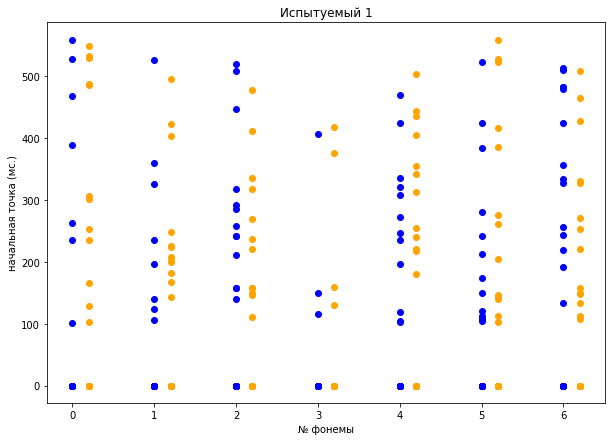

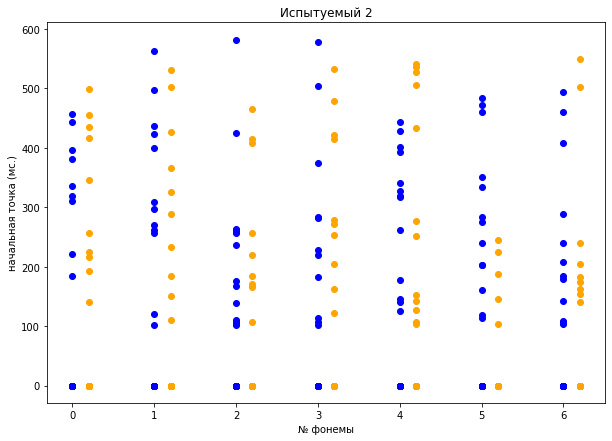

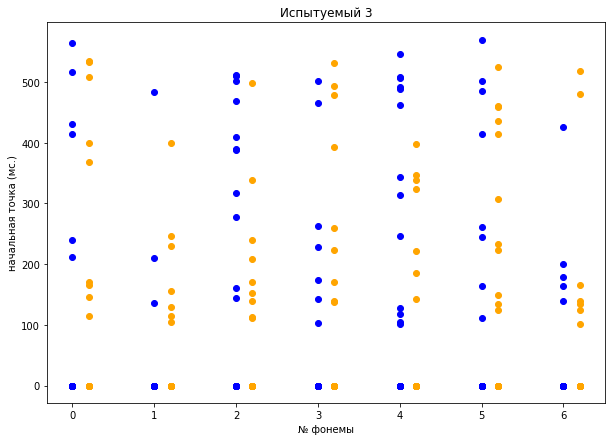

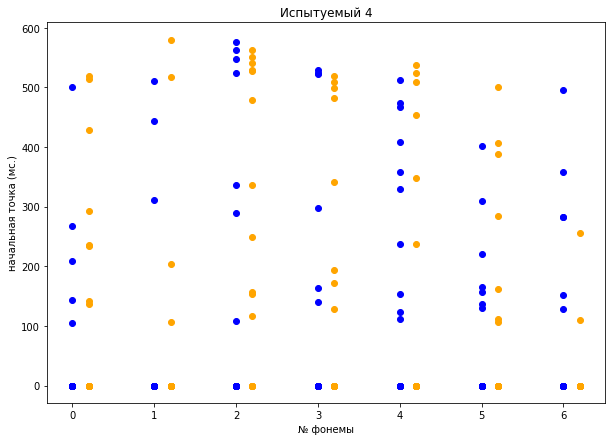

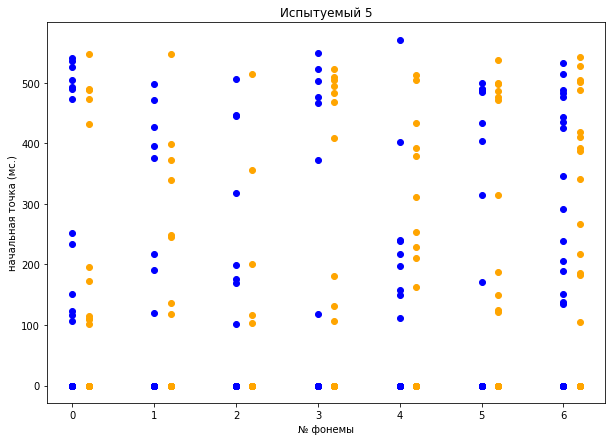

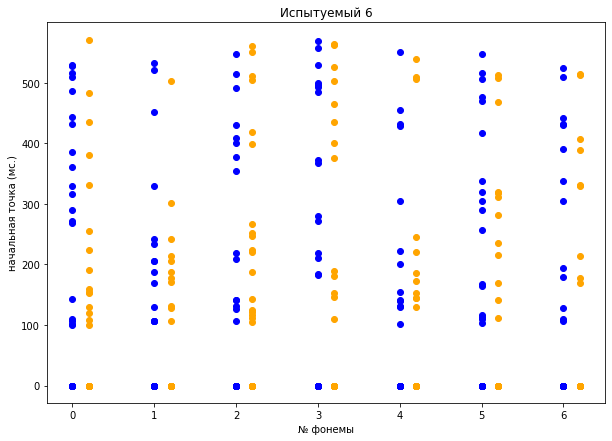

In [577]:
for i_person ,person in enumerate(edf_prosebaya_beginning_phonemes):
    fig, ax = plt.subplots(figsize =(10, 7))

    for i_phoneme, beginning_phoneme in enumerate(person):
        ax.plot([i_phoneme]*len(beginning_phoneme[0]), beginning_phoneme[0],'o', color ='blue')
        ax.plot([i_phoneme + 0.2]*len(beginning_phoneme[1]), beginning_phoneme[1],'o', color ='orange')
    
    plt.title(f'Испытуемый {i_person+1}')
    plt.xlabel('№ фонемы')
    plt.ylabel('начальная точка (мс.)')
    plt.show()

In [584]:
# процент нулевых точек: 
zero_counter = 0
all_counter = 0 
for i_person, person in enumerate(edf_prosebaya_beginning_phonemes):
    for i_phoneme, beginning_phoneme in enumerate(person):
        for i, beginning_phoneme_in_channel in enumerate(beginning_phoneme):
            zero_counter += len([i for i in beginning_phoneme_in_channel if i != 0 ])
            all_counter += len(beginning_phoneme_in_channel)
print(f'Процент ненулевых начальных точек: {round(zero_counter*100/all_counter)}%')

ZeroDivisionError: division by zero

In [583]:
for i_person, person in enumerate(edf_prosebaya_beginning_phonemes):
    fig, ax = plt.subplots(figsize =(10, 7))

    for i_phoneme, beginning_phoneme in enumerate(person):
        for i, beginning_phoneme_in_channel in enumerate(beginning_phoneme):
            mean = np.mean([i for i in beginning_phoneme_in_channel if i > 0 ])
            median = np.median([i for i in beginning_phoneme_in_channel if i > 0 ])
            
            ax.plot(i_phoneme+i*0.2, mean,'o', color ='gold' )
            ax.plot(i_phoneme+i*0.2, median,'o', color ='red')
    
    plt.title(f'Испытуемый {i_person+1}')
    plt.xlabel('№ фонемы')
    plt.ylabel('начальная точка (мс.)')
    plt.show()

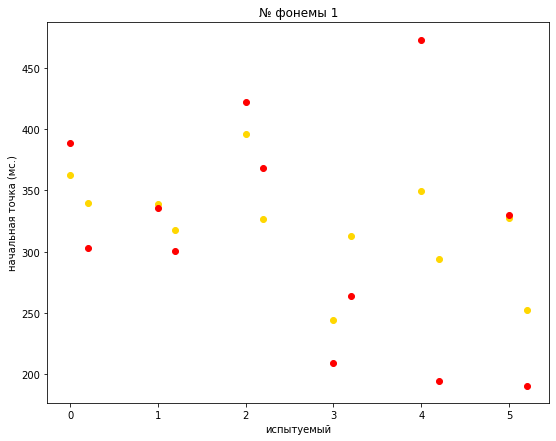

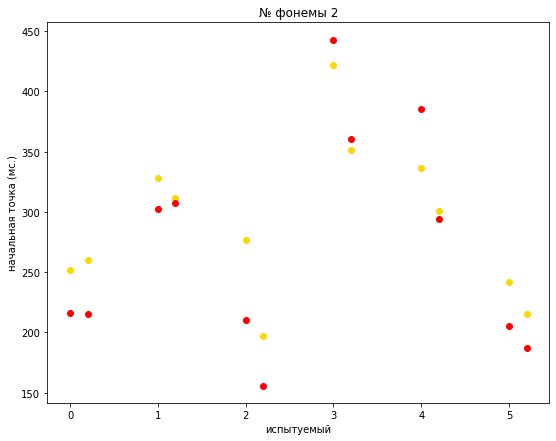

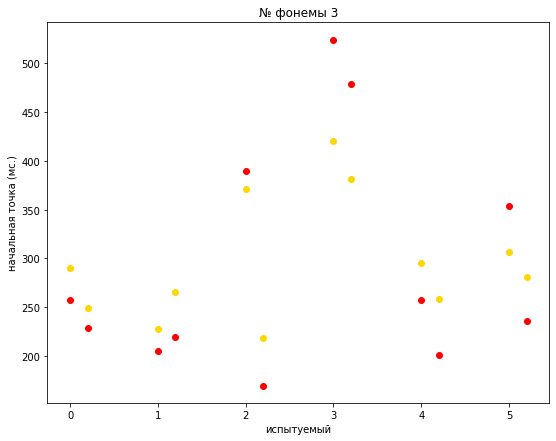

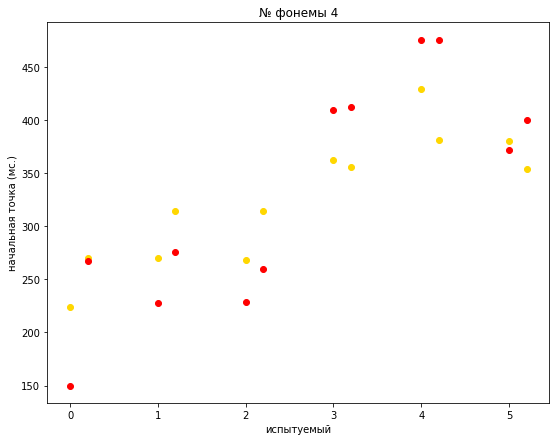

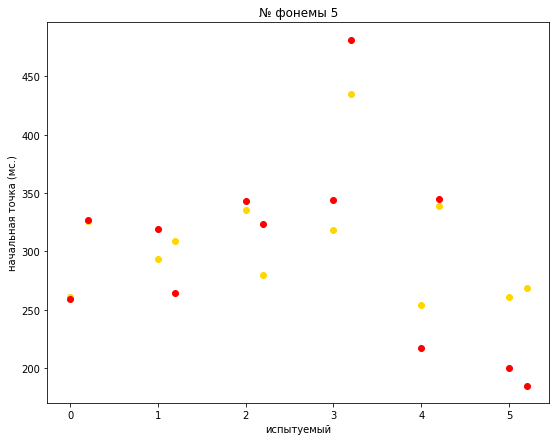

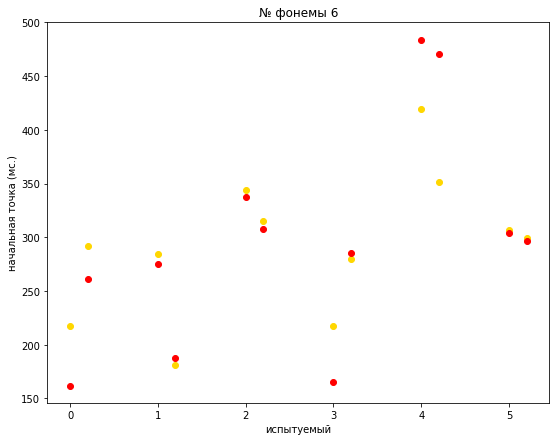

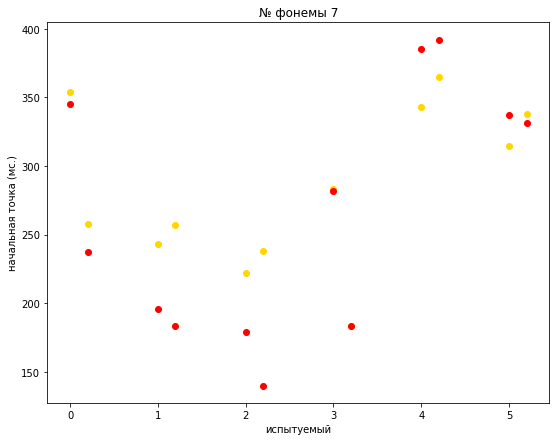

In [580]:
# Групируем значения по фоненмам

for i_phoneme in range(7):
    fig, ax = plt.subplots(figsize =(9, 7))
    
    for i_person, person in enumerate(edf_prosebaya_beginning_phonemes):
        for i, beginning_phoneme_in_channel in enumerate(person[i_phoneme]):
            
            mean = np.mean([i for i in beginning_phoneme_in_channel if i > 0 ])
            median = np.median([i for i in beginning_phoneme_in_channel if i > 0 ])
            
            ax.plot(i_person+i*0.2, mean,'o', color ='gold' )
            ax.plot(i_person+i*0.2, median,'o', color ='red')
    
    plt.title(f'№ фонемы {i_phoneme+1}')
    plt.xlabel('испытуемый')
    plt.ylabel('начальная точка (мс.)')
    plt.show()

In [581]:
phoneme_name = ["А – [а]", "Б – [б]", "Ф – [ф]", "Г – [г]", "М – [м]", "Р – [р]", "У – [у]"]
sectors_channels = ['EEG Fpz-M2','EEG Oz-M2']

windows_size = 100 

edf_prosebaya_beginning_phonemes = []

for efd_person in edf_prosebaya:
    sectors, labels = extract_strict_sectors(efd_person)

    phonemes_sectors = [[],[],[],[],[],[],[]]

    # распределяем данные по фоненам
    for i, (sector, label) in enumerate(zip(sectors, labels)):
        phonemes_sectors[label-1].append(sector)

    beginning_phonemes = [[[],[]] for _ in range(len(phonemes_sectors))]
    
    for i_phoneme, phoneme_sector in enumerate(phonemes_sectors):
        for i_channel, channel in enumerate(sectors_channels):
            for sector in phoneme_sector:
                a, b  = sector

                sector = get_channel_edf(efd_person, channel)[1][a:b]
                short_time_energy = get_short_time_energy(sector, windows_size)
                beginning_phonemes[i_phoneme][i_channel].append((search_beginning(short_time_energy)[0]))
    
    edf_prosebaya_beginning_phonemes.append(beginning_phonemes)

KeyboardInterrupt: 

### ZCR Скорость пересечения нуля

Частота пересечений нуля (уровня) речи, z(n), определяется как количество пересечений нуля (уровня) за интервал в 10 мс. 

In [157]:
def get_ZCR(timeserie, size_frame):
    ZCR = []
    for i_start_frame in range(len(timeserie)-size_frame):
        sum = 0 
        for i in range(i_start_frame, i_start_frame + size_frame - 1):
            sum += abs(np.sign(timeserie[i]) - np.sign(timeserie[i+1]))
        ZCR.append(sum*0.5)
    return ZCR

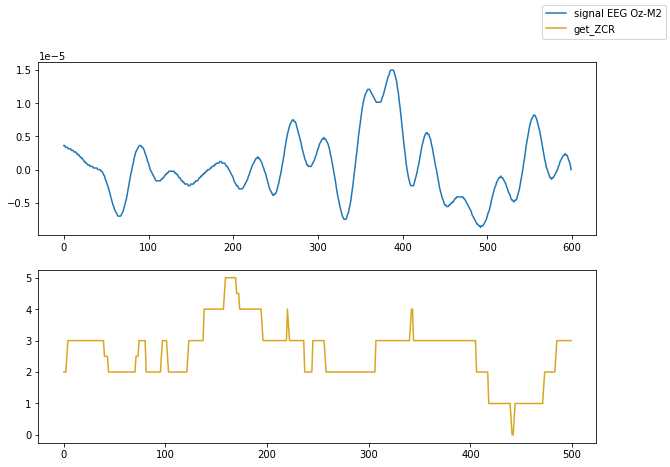

In [158]:
show_method(get_ZCR)

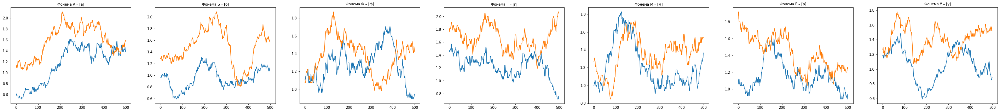

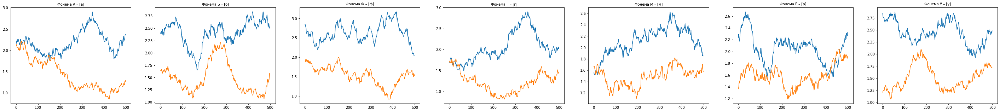

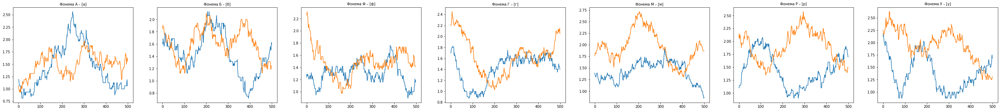

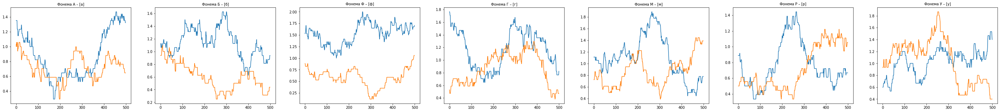

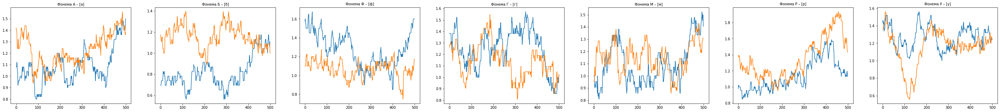

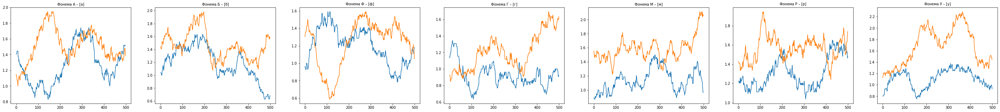

In [159]:
show_average_timeserie(get_ZCR, windows_size = 100) 

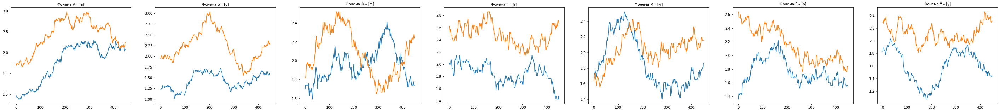

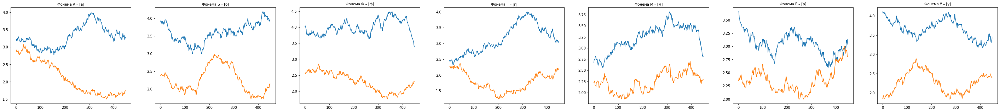

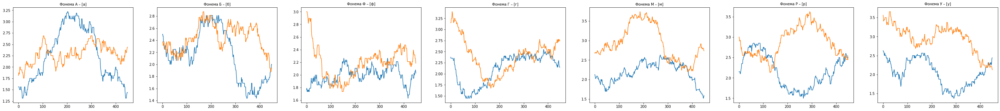

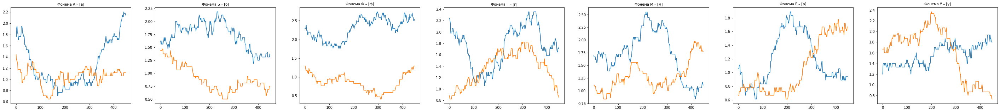

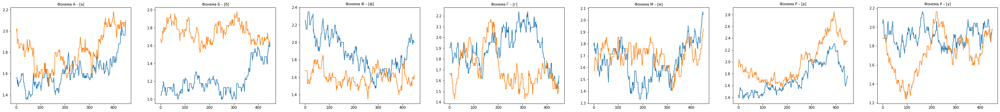

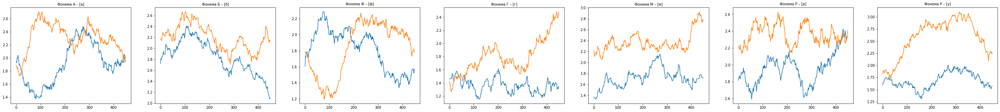

In [160]:
show_average_timeserie(get_ZCR, windows_size = 150) 

### Sample entropy

In [276]:
def sample_entropy(L, m = 2, r = 0.00002 ):
    """Sample entropy."""
    N = len(L)
    B = 0.0
    A = 0.0
    
    # Split time series and save all templates of length m
    xmi = np.array([L[i : i + m] for i in range(N - m)])
    xmj = np.array([L[i : i + m] for i in range(N - m + 1)])


    # Save all matches minus the self-match, compute B
    B = np.sum([np.sum(np.abs(xmii - xmj).max(axis=1) <= r) - 1 for xmii in xmi])

    # Similar for computing A
    m += 1
    xm = np.array([L[i : i + m] for i in range(N - m + 1)])

    A = np.sum([np.sum(np.abs(xmi - xm).max(axis=1) <= r) - 1 for xmi in xm])

    # Return SampEn
    if A == 0 or B == 0:
        entropy = 0
    else:
        entropy =  -np.log(A / B)

    return entropy

In [249]:
def get_sample_entropy(timeserie, windows_size, r = 0.00002 ):
    return [sample_entropy(np.array(timeserie[i_start:i_start + windows_size]), r = r) for i_start  in range(len(timeserie)-windows_size)]

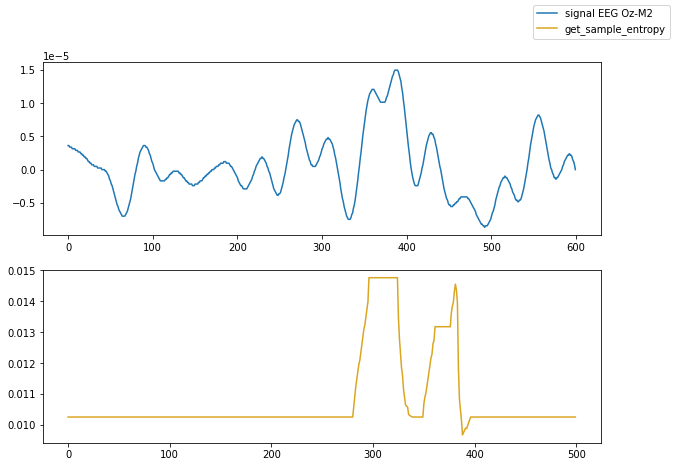

In [250]:
show_method(get_sample_entropy, windows_size = 100)

In [251]:
phoneme_name = ["А – [а]", "Б – [б]", "Ф – [ф]", "Г – [г]", "М – [м]", "Р – [р]", "У – [у]"]
sectors_channels = ['EEG Fpz-M2','EEG Oz-M2']

def show_average_timeserie_entropy(windows_size = 50, r = 0.00002):
    for efd_person in edf_prosebaya:
        sectors, labels = extract_strict_sectors(efd_person)

        phonemes_sectors = [[],[],[],[],[],[],[]]
        
        # распределяем данные по фоненам
        for i, (sector, label) in enumerate(zip(sectors, labels)):
            phonemes_sectors[label-1].append(sector)

        fig, ax = plt.subplots(figsize=(50, 5), nrows=1, ncols=7)

        for i, phoneme_sector in enumerate(phonemes_sectors):

            sector0 = get_channel_edf(efd_person, sectors_channels[0])[1][phoneme_sector[0][0]:phoneme_sector[0][1]]
            sector1 = get_channel_edf(efd_person, sectors_channels[1])[1][phoneme_sector[0][0]:phoneme_sector[0][1]]

            sum_sectors_channel0 = np.array(get_sample_entropy(sector0, windows_size, r))
            sum_sectors_channel1 = np.array(get_sample_entropy(sector1, windows_size, r))

            for sector in phoneme_sector:
                a, b  = sector

                sector0 = get_channel_edf(efd_person, sectors_channels[0])[1][a:b]
                sector1 = get_channel_edf(efd_person, sectors_channels[1])[1][a:b]

                sum_sectors_channel0 += np.array(get_sample_entropy(sector0, windows_size, r))
                sum_sectors_channel1 += np.array(get_sample_entropy(sector1, windows_size, r))

            avrg_sectors_channel0 = np.array(sum_sectors_channel0) / ( len(phoneme_sector) + 1 )
            avrg_sectors_channel1 = np.array(sum_sectors_channel1) / ( len(phoneme_sector) + 1 )

            ax[i].plot(avrg_sectors_channel0)
            ax[i].plot(avrg_sectors_channel1)
            ax[i].set_title(f'Фонема {phoneme_name[i]}', fontsize=10)
        plt.show()

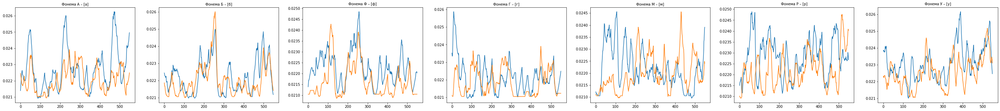

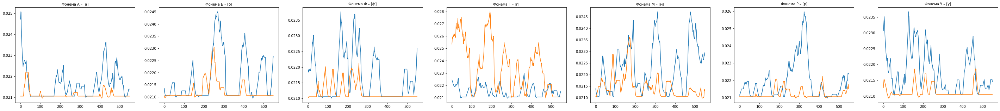

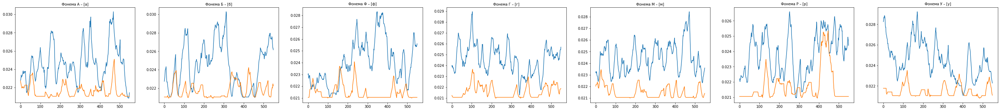

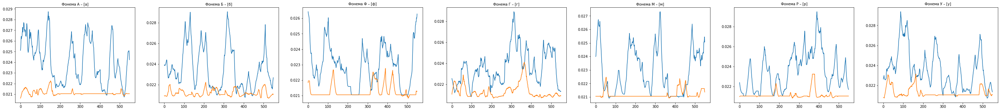

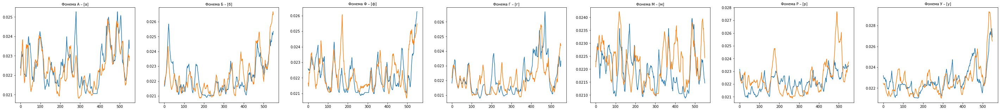

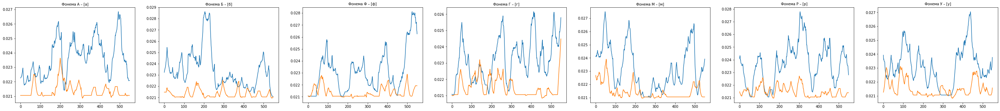

In [252]:
show_average_timeserie_entropy(windows_size = 50, r = 0.00002)

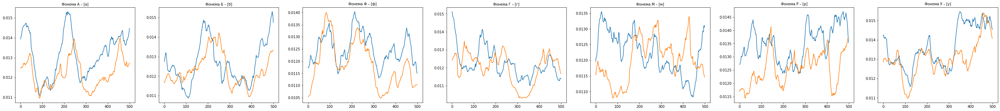

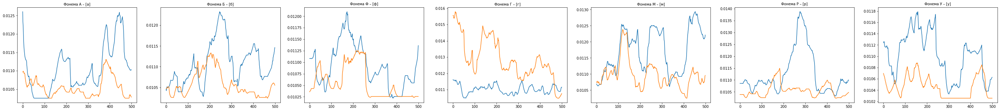

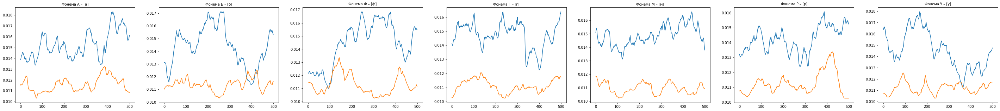

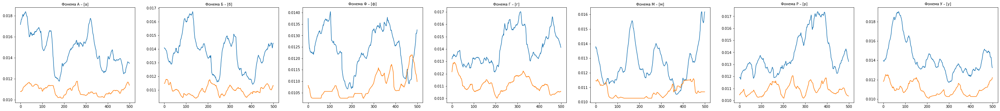

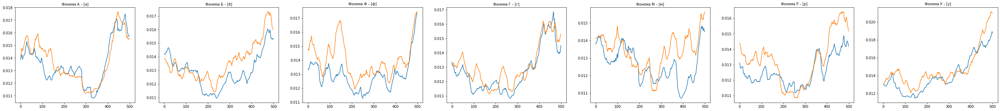

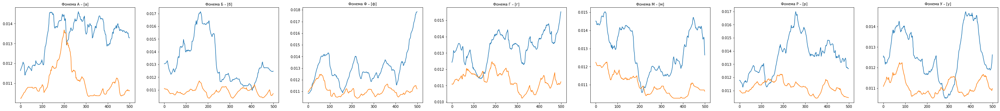

In [253]:
show_average_timeserie_entropy(windows_size = 100, r = 0.00004) 

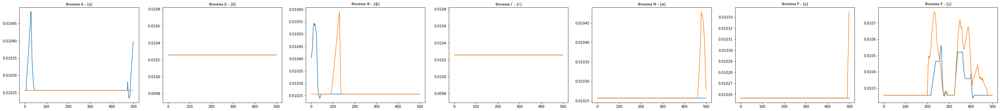

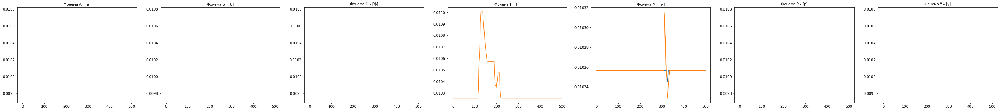

In [ ]:
show_average_timeserie_entropy(windows_size = 100, r = 0.00005) # уже плохо все при r = 0.00005

In [265]:
def get_sample_entropy_Hemming_window(timeserie, r = 0.00002):
    N = len(timeserie)

    res = []
    for i_start in range(len(timeserie)):
        window = 0.54-0.46*np.cos((2*np.pi*i_start)/(N-1))
        window = int(round(window,3)*1000) 
        res.append(sample_entropy(np.array(timeserie[i_start:i_start + window]), r = r))
    return res

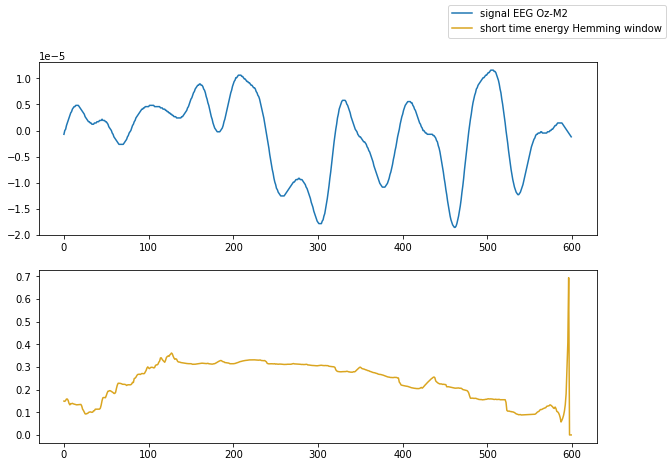

In [277]:
fig, ax = plt.subplots(figsize=(10, 7), nrows=2, ncols=1)  
sector = sectors[13]
a, b  = sector

sector = get_channel_edf(efd_person, 'EEG Oz-M2')[1][a:b]
ax[0].plot(sector,  label = f'signal EEG Oz-M2' )
y = get_sample_entropy_Hemming_window(sector, r = 0.000001)
    
ax[1].plot(y, color = "goldenrod", label = f'short time energy Hemming window')
fig.legend()

In [280]:
phoneme_name = ["А – [а]", "Б – [б]", "Ф – [ф]", "Г – [г]", "М – [м]", "Р – [р]", "У – [у]"]
sectors_channels = ['EEG Fpz-M2','EEG Oz-M2']

def show_average_timeserie_sample_entropy_Hemming_window(r = 0.000001):
    for efd_person in edf_prosebaya:
        sectors, labels = extract_strict_sectors(efd_person)

        phonemes_sectors = [[],[],[],[],[],[],[]]
        
        # распределяем данные по фоненам
        for i, (sector, label) in enumerate(zip(sectors, labels)):
            phonemes_sectors[label-1].append(sector)

        fig, ax = plt.subplots(figsize=(50, 5), nrows=1, ncols=7)

        for i, phoneme_sector in enumerate(phonemes_sectors):

            sector0 = get_channel_edf(efd_person, sectors_channels[0])[1][phoneme_sector[0][0]:phoneme_sector[0][1]]
            sector1 = get_channel_edf(efd_person, sectors_channels[1])[1][phoneme_sector[0][0]:phoneme_sector[0][1]]

            sum_sectors_channel0 = np.array(get_sample_entropy_Hemming_window(sector0, r))
            sum_sectors_channel1 = np.array(get_sample_entropy_Hemming_window(sector1, r))

            for sector in phoneme_sector:
                a, b  = sector

                sector0 = get_channel_edf(efd_person, sectors_channels[0])[1][a:b]
                sector1 = get_channel_edf(efd_person, sectors_channels[1])[1][a:b]

                sum_sectors_channel0 += np.array(get_sample_entropy_Hemming_window(sector0, r))
                sum_sectors_channel1 += np.array(get_sample_entropy_Hemming_window(sector1, r))

            avrg_sectors_channel0 = np.array(sum_sectors_channel0) / ( len(phoneme_sector) + 1 )
            avrg_sectors_channel1 = np.array(sum_sectors_channel1) / ( len(phoneme_sector) + 1 )

            ax[i].plot(avrg_sectors_channel0)
            ax[i].plot(avrg_sectors_channel1)
            ax[i].set_title(f'Фонема {phoneme_name[i]}', fontsize=10)
        plt.show()

In [ ]:
show_average_timeserie_sample_entropy_Hemming_window(r = 0.000001)

/usr/local/lib/python3.11/site-packages/librosa/core/spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=1800
  warnings.warn(


Text(0.5, 1.0, 'MFCC')

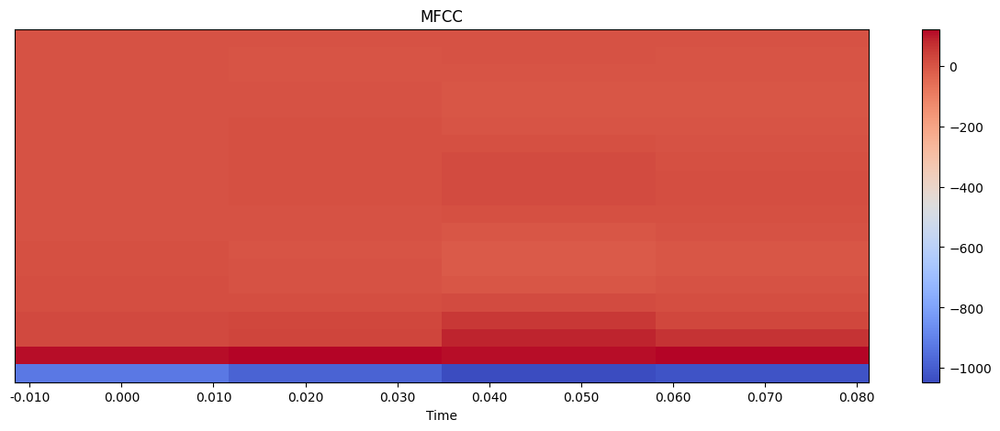

In [72]:
sector = sectors[13]
a, b  = sector

# Для демонстрации 
b+=600
a-=600

sectors_channel = np.array(get_channel_edf(efd_person,'EEG Fpz-M2')[1][a:b])
sr = 22050

mfccs = librosa.feature.mfcc(y = sectors_channel, n_mfcc=20)
plt.figure(figsize=(15, 5))
librosa.display.specshow(mfccs, x_axis='time')
plt.colorbar()
plt.title('MFCC')

/usr/local/lib/python3.11/site-packages/librosa/core/spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=600
  warnings.warn(


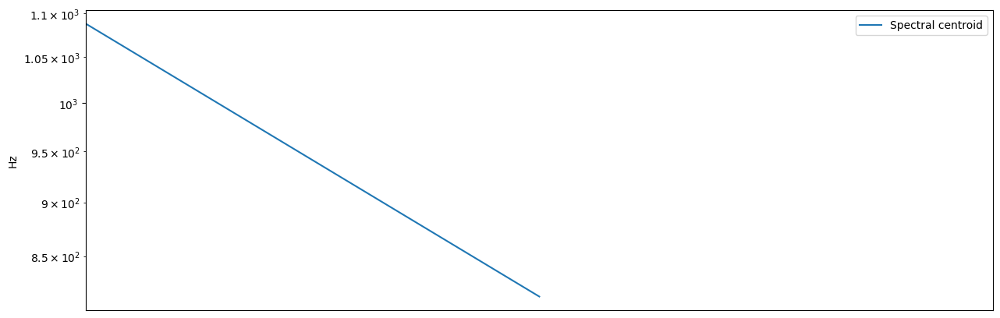

In [138]:
# Spectral Centroid
sector = sectors[15]
a, b  = sector

sectors_channel = np.array(get_channel_edf(efd_person,'EEG Fpz-M2')[1][a:b])

cent = librosa.feature.spectral_centroid(y=sectors_channel)
plt.figure(figsize=(15,5))
plt.subplot(1, 1, 1)
plt.semilogy(cent.T, label='Spectral centroid')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, cent.shape[-1]])
plt.legend()

[Text(0.5, 1.0, 'log Power spectrogram')]

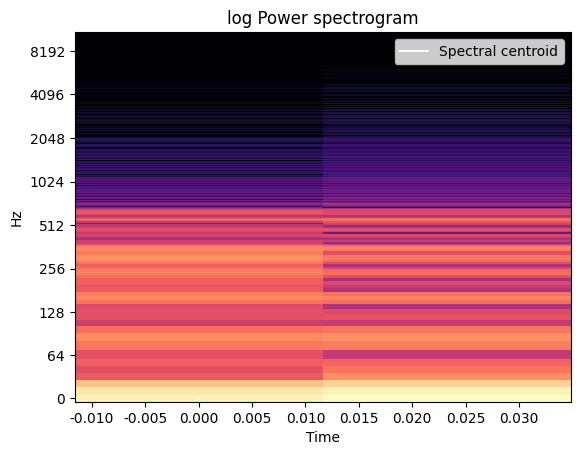

In [141]:
sector = sectors[15]
a, b  = sector

sectors_channel = np.array(get_channel_edf(efd_person,'EEG Fpz-M2')[1][a:b])

S, phase = librosa.magphase(librosa.stft(y=sectors_channel))
librosa.feature.spectral_centroid(S=S)

times = librosa.times_like(sectors_channel)
fig, ax = plt.subplots()
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                         y_axis='log', x_axis='time', ax=ax)
ax.plot(sectors_channel, sectors_channel.T, label='Spectral centroid', color='w')
ax.legend(loc='upper right')
ax.set(title='log Power spectrogram')